In [23]:
# Import module
import numpy as np
import os
import matplotlib.pyplot as plt
import PIL
from PIL import Image
import time
import cv2
import random
import torch
import torch.utils.data
from torch import nn
import torchvision
from torchvision import transforms
from albumentations import Resize, Compose,CenterCrop
from albumentations.pytorch.transforms import ToTensor
from albumentations.augmentations.transforms import Normalize

In [112]:
def final_results(result):
    if result['safe'] > result['unsafe']:
        return True
    else: 
        return False
    
def final_results_updated(result):
    if result['unsafe'] > 0.9:
        return False
    else: 
        return True
def show_multi_images (img_list):
    img_list.sort()
    if len(img_list) > 50:
#         img_list = random.sample(img_list, 50)
        img_list.sort()
    

    result = Image.new("RGB", (2000, 4000))

    for index, file in enumerate(img_list):
    #     print(index)x
    #     path = os.path.expanduser(file)
        img = Image.open(file)
    #     img.thumbnail((400, 400), Image.ANTIALIAS)
        img = img.resize((400, 400))
        x = index % 5 * 400
        y = index // 5 * 400
        w, h = img.size
        result.paste(img, (x, y, x + w, y + h))  

    # DPI, here, has _nothing_ to do with your screen's DPI.
    dpi = 80.0
    xpixels, ypixels = 2000, 4000

    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    plt.imshow(result)
    
    
def final_results_updated(result):
    if result['unsafe'] > 0.9:
        return False
    else: 
        return True

def show_multi_images_test (img_list):
    img_list.sort()
    if len(img_list) > 50:
#         img_list = random.sample(img_list, 50)
        img_list.sort()
    

    result = Image.new("RGB", (2000, 4000))

    for index, file in enumerate(img_list):
    #     print(index)x
    #     path = os.path.expanduser(file)
        img = Image.open(file)
        width, height = img.size
    #     img.thumbnail((400, 400), Image.ANTIALIAS)
        new_width = 400
        new_height = 400
        left = (width - new_width)/2
        top = (height - new_height)/2
        right = (width + new_width)/2
        bottom = (height + new_height)/2
        # Crop the center of the image
        img = img.crop((left, top, right, bottom))
        
        x = index % 5 * 400
        y = index // 5 * 400
        w, h = img.size
        result.paste(img, (x, y, x + w, y + h))  

    # DPI, here, has _nothing_ to do with your screen's DPI.
    dpi = 80.0
    xpixels, ypixels = 2000, 4000

    fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
    plt.imshow(result) 






def preprocessing_image(img_path):
    # transforamtions for input data
    transforms = Compose([
        Resize(244,244,interpolation=cv2.INTER_NEAREST),
        Normalize([0.485, 0.456, 0.406],
                  [0.229, 0.224, 0.225]),
        ToTensor(),
    ])
    input_img = cv2.imread(img_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    input_data = transforms(image=input_img)['image']
    # add batch dimension
    batch_data = torch.unsqueeze(input_data,0)
    return batch_data

def preprocessing_image_test(img_path):
    # transforamtions for input data
    transforms = Compose([
        CenterCrop(300,300),
        Resize(244,244,interpolation=cv2.INTER_NEAREST),
        Normalize([0.485, 0.456, 0.406],
                  [0.229, 0.224, 0.225]),
    
    ])
    input_img = cv2.imread(img_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    input_data = transforms(image=input_img)['image']
    # add batch dimension
    return input_data

def preprocessing_image_infant(img_path):
    # transforamtions for input data
    transforms = Compose([
        CenterCrop(300,300),
        Resize(244,244,interpolation=cv2.INTER_NEAREST),
        Normalize([0.485, 0.456, 0.406],
                  [0.229, 0.224, 0.225]),
        ToTensor(),
    ])
    input_img = cv2.imread(img_path)
    input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
    input_data = transforms(image=input_img)['image']
    # add batch dimension
    batch_data = torch.unsqueeze(input_data,0)
    return batch_data

def load_data (root_path):
#     root_path = './data/nude_sexy_safe_v1_x320/testing/'
    classes = ['porn','neutral','sexy']
    subfolders = [d for d in os.listdir(root_path) if d in classes]
    classes = {c:i for i,c in enumerate(subfolders)}
    print('there are three classes: {}'.format(classes))
    test_data = {}

    for folder in subfolders:
        items = os.listdir(os.path.join(root_path,folder))
        for names in items:
            if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = classes[folder]
                test_data[os.path.join(root_path,folder,names)] = label
    print('there are {} samples in the testing set'.format(len(test_data)))
    return test_data,classes

def postprocessing(output):
    confidence = torch.nn.functional.softmax(output,dim=1)[0]
#     confidence, indices = torch.sort(confidence, descending=True)
    return confidence

def postprocessing_0(output):
    confidence = torch.nn.functional.softmax(output,dim=1)[0]*100
    _, indices = torch.sort(output, descending=True)
    return indices[0]

def compute_accuracy(gts,dts):
    accurate = 0
    total = 0
    for key in gts.keys():
        if gts[key] == dts[key]:
            accurate += 1
        total += 1
    return accurate, total


def per_class_analysis (y_pred, y_true, classes):
    TP = [0 for i in range(len(classes))]
    FN = [0 for i in range(len(classes))]
    FP = [0 for i in range(len(classes))]
    precision = [0 for i in range(len(classes))]
    recall = [0 for i in range(len(classes))]
    y_pred_clean = []
    y_true_clean = []
    for key in y_pred.keys():
        confidence, label_pred = class_score_dict(y_pred[key],classes)
        label_true = y_true[key]
        y_pred_clean.append(label_pred)
        y_true_clean.append(label_true)
        if label_true == label_pred:
            TP[label_true] += 1
        else:
            FP[label_pred] += 1
            FN[label_true] += 1
    
    for i in range(len(classes)):
        precision[i] = TP[i]/(TP[i]+FP[i]+ 1e-16)
        recall[i] = TP[i] / (TP[i] + FN[i]+ 1e-16)
    
    return precision,recall,y_pred_clean,y_true_clean
        
        

def class_score_dict (y,classes):
    y_class = {classes[key]:y[classes[key]] for key in classes.keys()}
    y_largest = np.argmax(y, axis=0)
    return y_class,y_largest  
def error_analysis (y_true,y_pred,target_names):
    size = len(target_names)
    error_matrix = np.zeros([size,size],dtype = int)
    for i in range(len(y_pred)):
        a = y_true[i]
        b = y_pred[i]

        if a == b:
            error_matrix[a][b] += 1
        else:
            error_matrix[a][b] += 1
            
                
    return error_matrix
def obtain_error_list(y_pred, y_true,indexA,indexB):
    error_list = []
    for key in y_pred.keys():
        confidence, label_pred = class_score_dict(y_pred[key],classes)
        label_true = y_true[key]
        if label_pred == indexB and label_true == indexA:
            error_list.append(key)
    return error_list  

def filtered_accuracy (y_pred, y_true,indexA,conf_thre):
    total = 0
    acc = 0
    for key in y_pred.keys():
        confidence, label_pred = class_score_dict(y_pred[key],classes)
        label_true = y_true[key]
        if label_pred != indexA:
            continue
        if confidence[label_pred] > conf_thre:
            total += 1
            if label_pred == label_true:
                acc += 1
    print(total,acc)
    return acc/(total+1e-16)

def obtain_required_list(y_pred, y_true,indexA):
    img_list = []
    img_conf_list = []
    for key in y_pred.keys():
        confidence, label_pred = class_score_dict(y_pred[key],classes)
        label_true = y_true[key]
        if label_true == indexA:
            img_list.append(key)
            img_conf_list.append(confidence[indexA])
            
    return img_list, img_conf_list


In [16]:
# nude: 465 3413
# safe: 3861 189
# sexy: 393 1728

In [17]:
#infant 
class Args:
    data_dir = './data/clean_nsfw/'
    model = 'resnet50'
    device = [0]
    batch_size = 8
    print_freq = 10
    checkpoint = './ckpt/model_54_0.pth'
    workers = 1


args=Args()
classes = torch.load(args.checkpoint)['classes']
print(classes)
model = torchvision.models.__dict__[args.model](pretrained=False)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 3)
model.cuda()
model.load_state_dict(torch.load(args.checkpoint)['model'])
model.eval()

criterion = nn.CrossEntropyLoss()
model

['neutral', 'porn', 'sexy']


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
classes = torch.load(args.checkpoint)['classes']
print(classes)
classes = {key:i for i,key in enumerate(classes)}
print(classes)

['neutral', 'porn', 'sexy']
{'neutral': 0, 'porn': 1, 'sexy': 2}


In [6]:
#porn
root_path = './data/clean_nsfw/test/'
folder = 'porn'
test_data={}
items = os.listdir(os.path.join(root_path,folder))
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 1 #porn
                test_data[os.path.join(root_path,folder,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))

precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)
target_names = ['neutral', 'porn','sexy']
print(error_analysis(y_true_clean, y_pred_clean, target_names))


RunTime: 53.57252335548401, FPS: 37.33257040608052
[[   0    0    0]
 [  27 1939   34]
 [   0    0    0]]


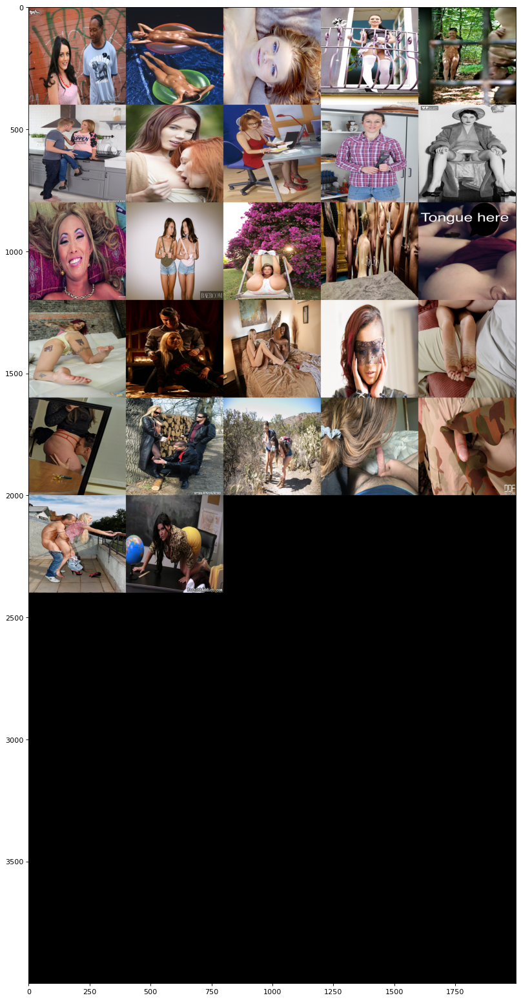

In [6]:
error_list = obtain_error_list(test_res,test_data,1,0)
show_multi_images (error_list)

In [7]:
#sexy
root_path = './data/clean_nsfw/test/'
folder = 'sexy'
test_data={}
items = os.listdir(os.path.join(root_path,folder))
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 2 #sexy
                test_data[os.path.join(root_path,folder,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))

precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)
target_names = ['neutral', 'porn','sexy']
print(error_analysis(y_true_clean, y_pred_clean, target_names))


RunTime: 105.28435468673706, FPS: 18.996174749332866
[[   0    0    0]
 [   0    0    0]
 [  76   74 1850]]


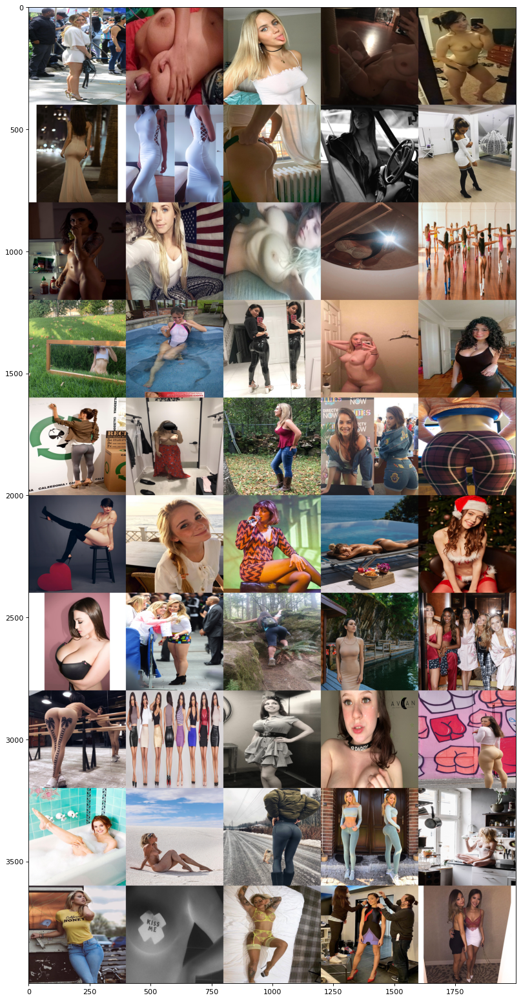

In [8]:
error_list = obtain_error_list(test_res,test_data,2,0)
show_multi_images (error_list)

In [9]:
#safe
root_path = './data/clean_nsfw/test/'
folder = 'neutral'
test_data={}
items = os.listdir(os.path.join(root_path,folder))
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #neutral
                test_data[os.path.join(root_path,folder,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))

precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)
target_names = ['neutral', 'porn','sexy']
print(error_analysis(y_true_clean, y_pred_clean, target_names))


RunTime: 151.94730257987976, FPS: 13.16245807620432
[[1940   18   42]
 [   0    0    0]
 [   0    0    0]]


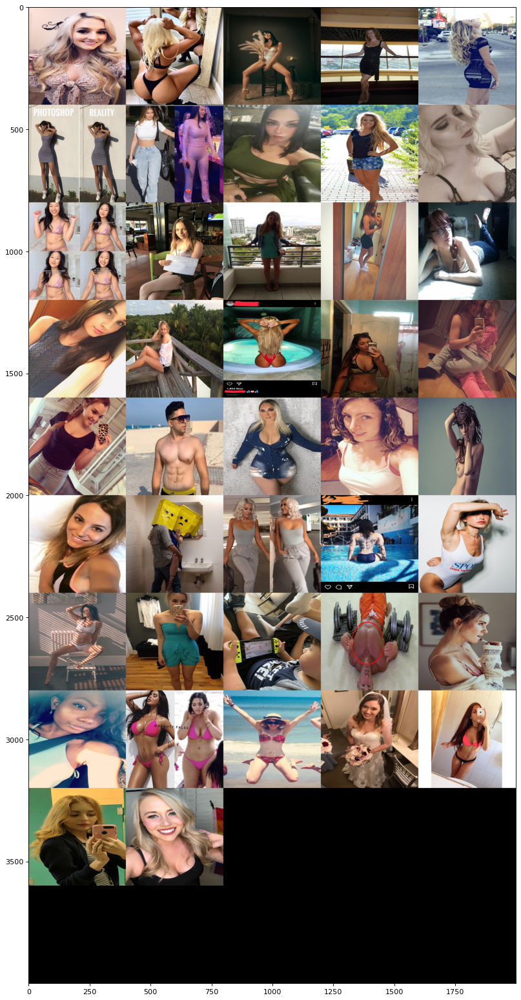

In [10]:
error_list = obtain_error_list(test_res,test_data,0,2)
show_multi_images (error_list)

In [11]:
# real examples

In [7]:
def split_videos(video,out_path):
    cap = cv2.VideoCapture(video)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print ("Frames per second : {}".format(fps))
    print ("Video length : {} seconds".format(total/fps))
    i=0
    second = 0
#     fps = 1 # save all frames
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == False:
            break
        if i % fps == 0:
            
            cv2.imwrite(out_path + '/' + str(second).zfill(5) + '.jpg',frame)
            second +=1
        i+=1
    cap.release()
    
def reuslts_analysis(results):
    x_all = []
    x_safe = []
    x_unsafe = []
    y_safe = []
    y_unsafe = []
    for key in results.keys():
        x = int(key[-9:-4])
        safe = results[key]['safe']
        unsafe = results[key]['unsafe']
        x_all.append(x)
        x_safe.append(x)
        y_safe.append(safe)
        x_unsafe.append(x)
        y_unsafe.append(unsafe)
        
    y_all = []
    for i in range(len(x_all)):
        if i == 0:
            y = (sum(y_unsafe[i:i+5])-sum(y_safe[i:i+5]))/5
            y_all.append(y)
        elif i == 1:
            y = (sum(y_unsafe[i-1:i+4])-sum(y_safe[i-1:i+4]))/5
            y_all.append(y)
        elif i == (len(x_all) - 2):
            y = (sum(y_unsafe[i-4:i+1])-sum(y_safe[i-4:i+1]))/5
            y_all.append(y)
        elif i == (len(x_all) - 1):
            y = (sum(y_unsafe[i-5:i])- sum(y_safe[i-5:i]))/5
            y_all.append(y)
        else:
            y = (sum(y_unsafe[i-2:i+3]) - sum(y_safe[i-2:i+3]))/5
            y_all.append(y)
    return x_all,x_safe,x_unsafe,y_safe,y_unsafe, y_all



In [8]:
# Fifty shades of Grey
#save all frames
root_path = './demo/'
file_name = '50shades.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
 

Frames per second : 24
Video length : 404.7916666666667 seconds


In [9]:

test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy))

RunTime: 9.057823657989502, FPS: 44.712727393712015
345 55 5


{'./demo/50shades/raw/00402.jpg': array([9.9995911e-01, 3.5932462e-05, 5.0425324e-06], dtype=float32),
 './demo/50shades/raw/00054.jpg': array([9.3727714e-01, 6.2719248e-02, 3.5569374e-06], dtype=float32),
 './demo/50shades/raw/00167.jpg': array([9.9990952e-01, 9.2057608e-06, 8.1320126e-05], dtype=float32),
 './demo/50shades/raw/00018.jpg': array([9.9709237e-01, 2.8455895e-03, 6.1989675e-05], dtype=float32),
 './demo/50shades/raw/00024.jpg': array([9.9809092e-01, 1.8716756e-03, 3.7340629e-05], dtype=float32),
 './demo/50shades/raw/00078.jpg': array([9.9949348e-01, 2.1984240e-05, 4.8449627e-04], dtype=float32),
 './demo/50shades/raw/00260.jpg': array([9.9378395e-01, 6.2148203e-03, 1.2213646e-06], dtype=float32),
 './demo/50shades/raw/00327.jpg': array([9.5805389e-01, 4.1455735e-02, 4.9029180e-04], dtype=float32),
 './demo/50shades/raw/00046.jpg': array([0.9631184 , 0.01003064, 0.02685101], dtype=float32),
 './demo/50shades/raw/00289.jpg': array([9.9990928e-01, 5.9878941e-05, 3.0849213e-

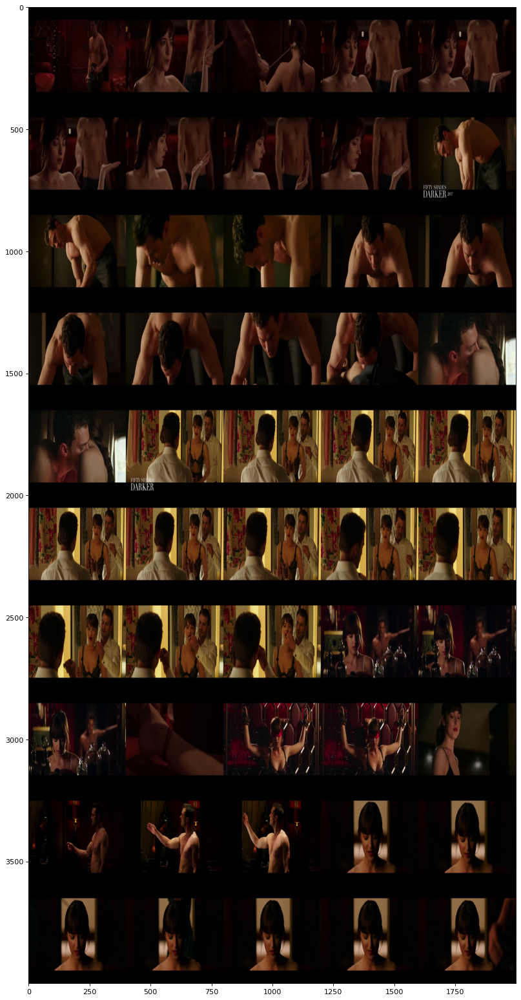

In [19]:
show_multi_images (porn)

In [31]:
# office

#save all frames
root_path = './demo/'
file_name = 'office.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
    

Frames per second : 23
Video length : 229.0 seconds


In [32]:

test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy))

RunTime: 82.45968079566956, FPS: 63.873640416476135
5245 22 0


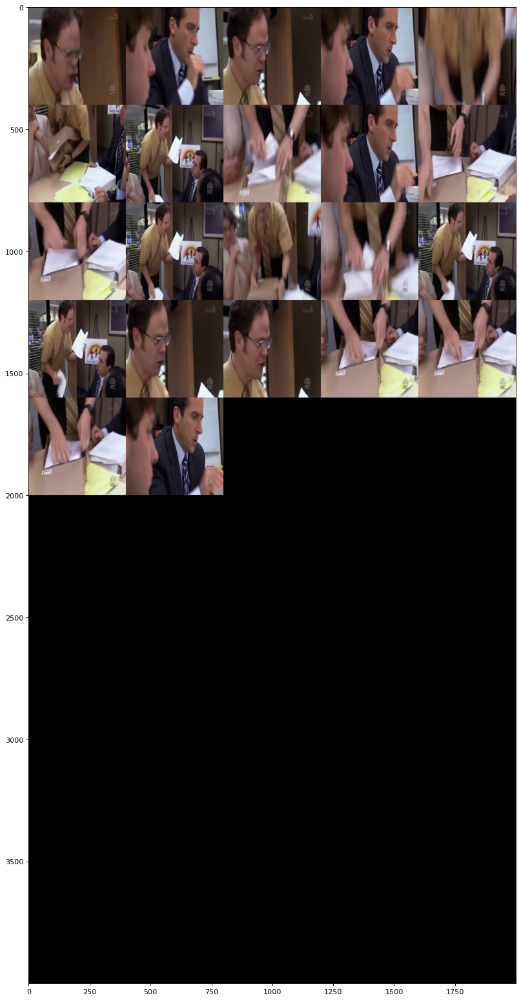

In [33]:
# error_list = obtain_error_list(test_res,test_data,0,1)
show_multi_images (porn)

In [ ]:
# # print(len(items))
# img_list = []
# for names in items:
#     if names.endswith(".jpg"):
#         img_list.append(os.path.join(raw_path,names))
# print('there are {} images'.format(len(img_list)))

# start_time = time.time()
# results = classifier.classify(img_list, batch_size=1)
# end_time = time.time()
# print("total inference time: {}. FPS: {}". format(end_time-start_time,len(img_list)/(end_time-start_time)))
# x_all,x_safe,x_unsafe,y_safe,y_unsafe,y_all = reuslts_analysis(results)
# plt.plot(x_safe, y_safe,'o', color='black');
# plt.plot(x_unsafe, y_unsafe,'o', color='red'); 

In [ ]:
# # visualize some results

# flag = 'unsafe'
# error_list = []
# for key in results.keys():
#     if results[key][flag] > 0.9:
#         error_list.append(key)
# print(len(error_list))
    
# show_multi_images(error_list)

In [ ]:
# # visualize some results
# # Too many false-positive predictions
# flag = 'unsafe'
# error_list = []
# for key in results.keys():
#     if results[key][flag] > 0.5 and results[key][flag] < 0.9 :
#         error_list.append(key)
# print(len(error_list))
# show_multi_images(error_list)

In [37]:
# GoT
#save all frames
root_path = './demo/'
file_name = 'got.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()

test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy)) 

Frames per second : 23
Video length : 588.9130434782609 seconds
RunTime: 14.359432697296143, FPS: 41.01833355233509
515 73 1


In [64]:
test_data

{'./demo/got/raw/00402.jpg': 0,
 './demo/got/raw/00054.jpg': 0,
 './demo/got/raw/00167.jpg': 0,
 './demo/got/raw/00018.jpg': 0,
 './demo/got/raw/00439.jpg': 0,
 './demo/got/raw/00024.jpg': 0,
 './demo/got/raw/00078.jpg': 0,
 './demo/got/raw/00260.jpg': 0,
 './demo/got/raw/00425.jpg': 0,
 './demo/got/raw/00558.jpg': 0,
 './demo/got/raw/00553.jpg': 0,
 './demo/got/raw/00327.jpg': 0,
 './demo/got/raw/00433.jpg': 0,
 './demo/got/raw/00046.jpg': 0,
 './demo/got/raw/00537.jpg': 0,
 './demo/got/raw/00289.jpg': 0,
 './demo/got/raw/00155.jpg': 0,
 './demo/got/raw/00511.jpg': 0,
 './demo/got/raw/00464.jpg': 0,
 './demo/got/raw/00415.jpg': 0,
 './demo/got/raw/00103.jpg': 0,
 './demo/got/raw/00235.jpg': 0,
 './demo/got/raw/00556.jpg': 0,
 './demo/got/raw/00242.jpg': 0,
 './demo/got/raw/00512.jpg': 0,
 './demo/got/raw/00571.jpg': 0,
 './demo/got/raw/00362.jpg': 0,
 './demo/got/raw/00472.jpg': 0,
 './demo/got/raw/00232.jpg': 0,
 './demo/got/raw/00313.jpg': 0,
 './demo/got/raw/00181.jpg': 0,
 './demo

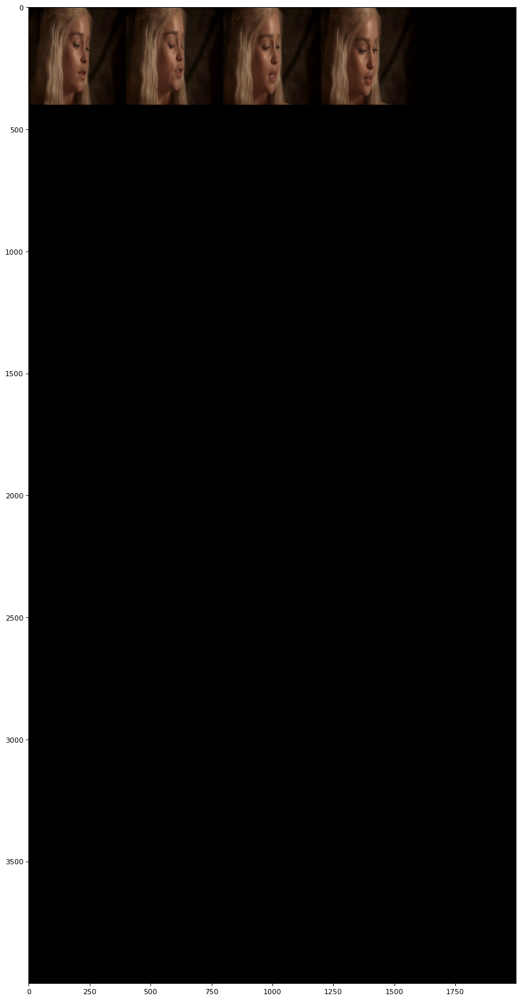

In [66]:
new = porn[39:43]
show_multi_images(new)

In [67]:
new

['./demo/got/raw/00333.jpg',
 './demo/got/raw/00334.jpg',
 './demo/got/raw/00335.jpg',
 './demo/got/raw/00336.jpg']

In [69]:
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in new:
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()
        print(pred)

tensor([1.1226e-02, 9.8875e-01, 2.1583e-05], device='cuda:0')
tensor([1.9795e-01, 8.0193e-01, 1.1897e-04], device='cuda:0')
tensor([5.4920e-03, 9.9450e-01, 8.1425e-06], device='cuda:0')
tensor([2.0665e-02, 9.7932e-01, 1.3464e-05], device='cuda:0')


In [68]:
prob = []
for item in new:
    print(test_res[item])
    prob.append(test_res[item][1])
#     print(test_res[item][1])
prob

[1.12258205e-02 9.88752663e-01 2.15830278e-05]
[1.9795258e-01 8.0192846e-01 1.1897370e-04]
[5.4920446e-03 9.9449980e-01 8.1425133e-06]
[2.066477e-02 9.793218e-01 1.346383e-05]


[0.98875266, 0.80192846, 0.9944998, 0.9793218]

In [66]:
# Basketball
#save all frames
root_path = './demo/'
file_name = 'basketball.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
# print(len(items))
test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy)) 

Frames per second : 29
Video length : 204.6551724137931 seconds


KeyboardInterrupt: 

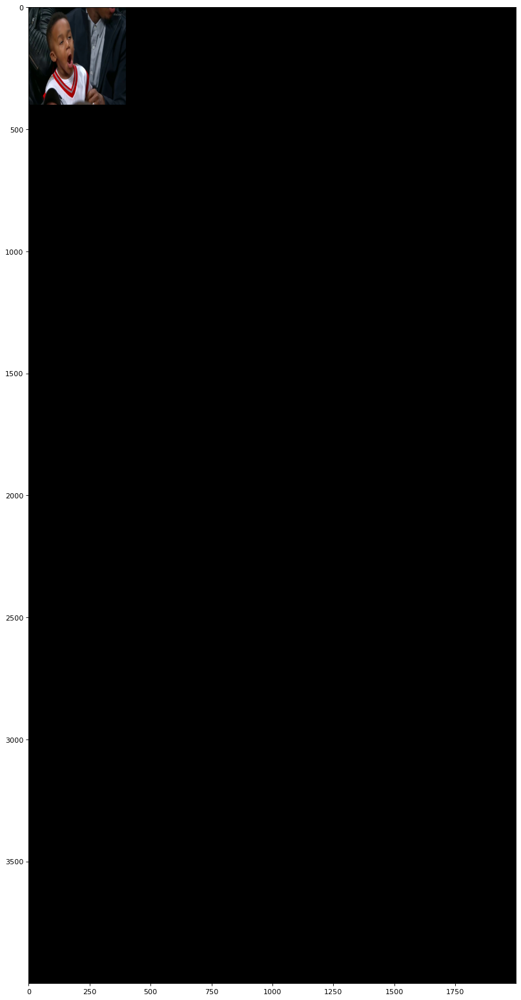

In [43]:
show_multi_images (porn)

In [89]:
# Infant
#save all frames
root_path = './demo/'
file_name = 'infant.mp4'
video_path = os.path.join(root_path,file_name)
if not os.path.exists(video_path):
    print('wrong path')
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
# print(len(items))
test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy))  

Frames per second : 29
Video length : 349.7586206896552 seconds
RunTime: 8.522426128387451, FPS: 41.068117778596026
207 129 14


In [90]:
print(len(porn))

129


In [91]:
print(len(porn_cc))

84


In [118]:
porn_same = [i for i in porn if i not in porn_cc]
print(len(porn_same))

94


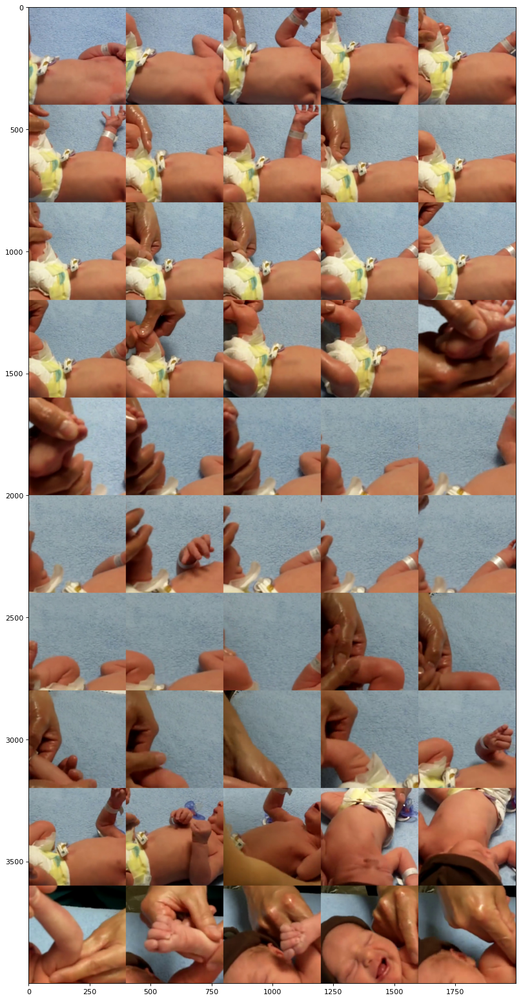

In [119]:
show_multi_images_test (porn_same)

In [58]:
count = 0
new_porn = []
for item in porn:
    if test_res[item][1] > 0.98:
        count +=1
        new_porn.append(item)
print(count/len(porn))

0.24031007751937986


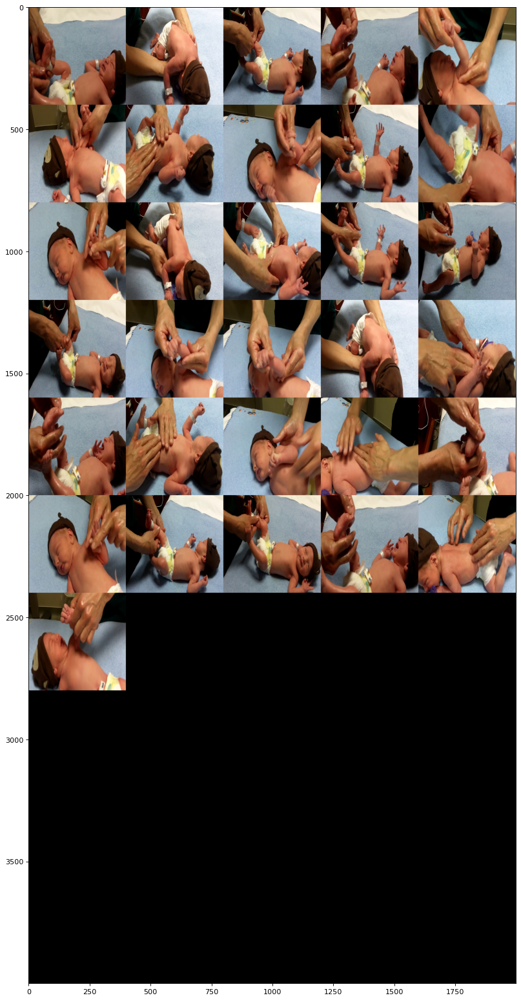

In [59]:
show_multi_images (new_porn)

In [ ]:
# visualize some results

flag = 'unsafe'
error_list = []
for key in results.keys():
    if results[key][flag] > 0.9:
        error_list.append(key)
    
show_multi_images(error_list)

In [ ]:
# post-processing

In [ ]:

#save all frames
root_path = './demo/'
file_name = '50shades.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
# print(len(items))
img_list = []
for names in items:
    if names.endswith(".jpg"):
        img_list.append(os.path.join(raw_path,names))
print('there are {} images'.format(len(img_list)))

start_time = time.time()
results = classifier.classify(img_list, batch_size=1)
end_time = time.time()
print("total inference time: {}. FPS: {}". format(end_time-start_time,len(img_list)/(end_time-start_time)))
x_all,x_safe,x_unsafe,y_safe,y_unsafe,y_all = reuslts_analysis(results)

In [ ]:
img_list

In [ ]:
fig = plt.figure()
dpi = 80.0
xpixels, ypixels = 500, 1000

fig = plt.figure(figsize=(ypixels/dpi, xpixels/dpi), dpi=dpi)
plt.subplot(2, 1, 1)
plt.plot(x_safe, y_safe,'o',color = 'black')
plt.plot(x_unsafe, y_unsafe,'o',color = 'red')

plt.subplot(2, 1, 2)
plt.plot(x_all, y_all,'o',color = 'blue')
plt.show()

In [ ]:
# single image unsafe confidence > 0.98 or smoothed unsafe confidence >0.8
single_threshold = 0.98
smoothed_threshold = 0.8
unsafe_index = [index for index,value in enumerate(y_all) if value > smoothed_threshold or y_unsafe[index] > single_threshold]

error_list = [list(results.keys())[i] for i in range(len(y_all)) if i in unsafe_index]
print('There are {} unsafe images'.format(len(error_list)))
show_multi_images(error_list)



In [ ]:
unsafe_index = range(150,200)
error_list = [list(results.keys())[i] for i in range(len(y_all)) if i in unsafe_index]
show_multi_images(error_list)


In [ ]:
pig_img = './demo/pig/pig.png'
pig_img_1 = './demo/pig/pig1.png'
img_list = []
img_list.append(pig_img)
img_list.append(pig_img_1)
results = classifier.classify(img_list, batch_size=1)


In [ ]:
show_multi_images(img_list)

In [70]:
# friends
#save all frames
root_path = './demo/'
file_name = 'friends.mp4'
video_path = os.path.join(root_path,file_name)
file_name = video_path[:-4].split('/')[-1]
raw_path = os.path.join(root_path,file_name,'raw')
if not os.path.exists(raw_path):
    os.makedirs(raw_path)

split_videos(video_path, raw_path)

items = os.listdir(raw_path)
items.sort()
# print(len(items))
test_data={}
items = os.listdir(raw_path)
for names in items:
    if names.endswith(".jpg") or names.endswith(".jpeg") or names.endswith(".png"):
                label = 0 #porn
                test_data[os.path.join(raw_path,names)] = label
                
count = 0
start_time = time.time()
with torch.no_grad():
    model.eval()
    model.cuda()
    test_res = {}
    for key in test_data.keys():
        count += 1 
        image = preprocessing_image(key).cuda()
        output = model(image)
        pred = postprocessing(output)
        test_res[key] = pred.cpu().numpy()

end_time = time.time()
print('RunTime: {}, FPS: {}'.format(end_time-start_time,len(test_data)/(end_time-start_time)))
# precision, recall, y_pred_clean, y_true_clean = per_class_analysis(test_res,test_data,classes)

# neutral,porn,sexy = 0,0,0
# for item in y_pred_clean:
#     if item == 0:
#         neutral += 1
#     elif item == 1:
#         porn +=1 
#     elif item == 2:
#         sexy += 1
# print(neutral,porn,sexy)

neutral = []
porn =[]
sexy = []
for key in test_res.keys():
    if test_res[key].argmax() == 0:
        neutral.append(key)
    elif test_res[key].argmax() == 1:
        porn.append(key)
    elif test_res[key].argmax() == 2:
        sexy.append(key)
print(len(neutral),len(porn),len(sexy)) 

Frames per second : 23
Video length : 154.1304347826087 seconds
RunTime: 3.953939914703369, FPS: 39.201405014680994
120 33 2


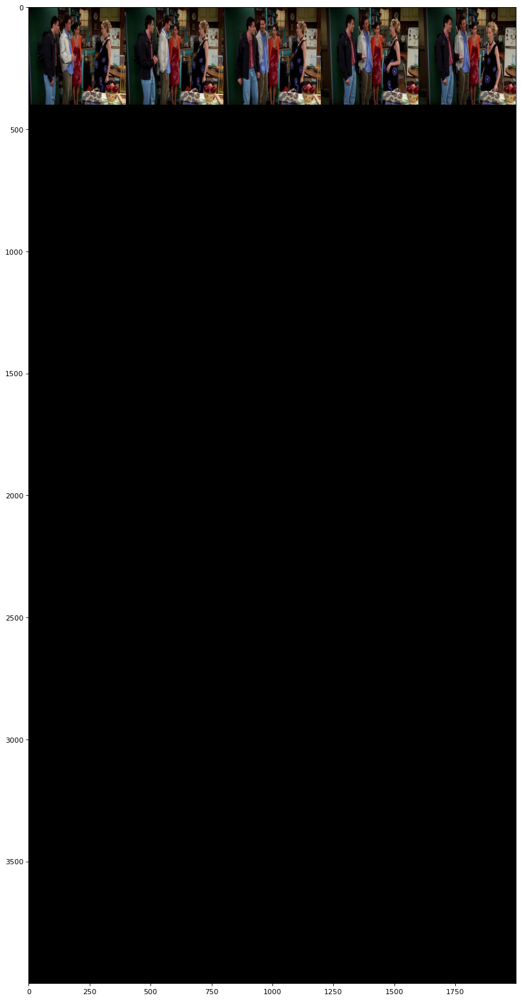

In [80]:
new = porn[6:11]
show_multi_images(new)

In [81]:
prob = []
for item in new:
    print(test_res[item])
    prob.append(test_res[item][1])
#     print(test_res[item][1])
prob

[4.1460719e-02 9.5853931e-01 2.7139653e-09]
[5.8692186e-03 9.9413079e-01 6.6304191e-11]
[5.8709424e-02 9.4129056e-01 1.6140550e-08]
[7.6731957e-02 9.2326802e-01 1.7940813e-09]
[2.5537038e-01 7.4462956e-01 4.2604022e-08]


[0.9585393, 0.9941308, 0.94129056, 0.923268, 0.74462956]